# Predictive Modeling in Healthcare : Multi-Class Classification of Medical Test Results using ML and DL Techniques

![Alt text](medical.png)

The **Healthcare Dataset** is a synthectic dataset generated to mimic real-world healthcare data.It is designed to help data science, machine learning, and data analysis enthusiasts develop and test their skills in healthcare analytics while avoiding privacy concerns associated with real patient data.The dataset can be used for various tasks, such as classification, prediction and data visualization and focuses on solving a **Multi-Class Classification Problem** where the target is the **Test Results** column.

### Dataset Structure:
Here is a breakdown of the datasets columns and their descriptions.

1.**Name** : This column contians the name of the patient associated with each healthcare record.
2.**Age** : Represents the age of the patient at the time of admission, in years.
3.**Gender** : Indicates the patients gender, either "Male" or "Female".
4.**Blood Type** : The patients blood type, which could be one of the common types such as "A+", "O+", etc.
5.**Medical Condition** : Specifies the primary diagonsis or medical condition of the patient (eg.,"Diabetes", "Hypertension", "Asthma").
6.**Date of Admission** : The date on which the patient was admitted to the hospital or healthcare facility.
7.**Doctor** : The name of the doctor responsible for the patients care.
8.**Hospital** : Identifies the healthcare facility where the patient was admitted.
9.**Insurance Provider** : This column indicates the insurance provider (eg.,"Aetna", "Blue Cross", "Cigna").
10.**Billing Amount** : The cost of the healthcare services billed to the patient, expressed as a floating-point number.
11.**Room Number** : The number of the room where the patient was accommodated during their stay.
12.**Admission Type** : Indicates the type of hospital admission (eg.,"Emergency", "Elective" or "Urgent").
13.**Discharge Date** : The date the patient was discharged from the facaility, calculated based on the admission date.
14.**Medication** : Medication prescribed during the patients stay (eg.,"Aspirin", "Ibuprofen", "Penicillin").
15.**Test Result** : The results of a medical test performed during the patients stay. It is the **target column** for classification and has three possible **outcomes:"Normal","Abnormal","Inconclusive".**

**Usage Scenarios:**
The dataset can be applied in various scenarios, such as:
- **Healthcare Prediction Models**: Develop predcitive models that can forecast the patients medical test results (Normal,Abnormal,Inconclusive) based on patient characteristics.
- **Data Cleaning and Transformation**: Data Pre-Processing techniques like handling missing data, transforming categorical variables and normalizing numerical features.
- **Data Visualization**: Gain insights by visualizing trends, such as how test results vary with age, medical conditions or hospital admission types.
- **Healthcare Analytics Education**: Use this data for learning purpose related to healthcare data analysis, machine learning models, or general data science techniques.

**Multi-Class Classification Problem**:
The primary objective is to classify the **Test Results** into one of the three categories:

1.**Normal**
2.**Abnormal**
3.**Inconclusive**

By using the features such as Age, Medical Condition, Admission Type, Medication, etc., we can train a multi-class classsification model (like Random Forest, Decision Tree, Neural Networks) to predict the outcomes.

In [1]:
# importing basic libraries
import os
import numpy as np
import pandas as pd
import seaborn as sns
sns.set()
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

In [2]:
# importing the dataset
df = pd.read_csv('healthcare_dataset_new.csv')
df.head()

,Name,Age,Gender,Blood Type,Medical Condition,Date of Admission,Doctor,Hospital,Insurance Provider,Billing Amount,Room Number,Admission Type,Discharge Date,Medication,Test Results
0,Bobby JacksOn,30,Male,B-,Cancer,31-01-2024,Matthew Smith,Sons and Miller,Blue Cross,18856.28131,328,Urgent,02-02-2024,Paracetamol,Normal
1,LesLie TErRy,62,Male,A+,Obesity,20-08-2019,Samantha Davies,Kim Inc,Medicare,33643.32729,265,Emergency,26-08-2019,Ibuprofen,Inconclusive
2,DaNnY sMitH,76,Female,A-,Obesity,22-09-2022,Tiffany Mitchell,Cook PLC,Aetna,27955.09608,205,Emergency,07-10-2022,Aspirin,Normal
3,andrEw waTtS,28,Female,O+,Diabetes,18-11-2020,Kevin Wells,"Hernandez Rogers and Vang,",Medicare,37909.78241,450,Elective,18-12-2020,Ibuprofen,Abnormal
4,adrIENNE bEll,43,Female,AB+,Cancer,19-09-2022,Kathleen Hanna,White-White,Aetna,14238.31781,458,Urgent,09-10-2022,Penicillin,Abnormal


In [3]:
df.shape

(55500, 15)

# Data Cleaning and EDA

In [4]:
# checking columns
df.columns

Index(['Name', 'Age', 'Gender', 'Blood Type', 'Medical Condition',
       'Date of Admission', 'Doctor', 'Hospital', 'Insurance Provider',
       'Billing Amount', 'Room Number', 'Admission Type', 'Discharge Date',
       'Medication', 'Test Results'],
      dtype='object')

In [5]:
# checking any duplicates value
df.duplicated().sum()

534

In [6]:
# dropping duplicates
df = df.drop_duplicates()

In [7]:
df.duplicated().sum()

0

In [8]:
# checking missing values
df.isnull().sum()

Name                  0
Age                   0
Gender                0
Blood Type            0
Medical Condition     0
Date of Admission     0
Doctor                0
Hospital              0
Insurance Provider    0
Billing Amount        0
Room Number           0
Admission Type        0
Discharge Date        0
Medication            0
Test Results          0
dtype: int64

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 54966 entries, 0 to 55499
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Name                54966 non-null  object 
 1   Age                 54966 non-null  int64  
 2   Gender              54966 non-null  object 
 3   Blood Type          54966 non-null  object 
 4   Medical Condition   54966 non-null  object 
 5   Date of Admission   54966 non-null  object 
 6   Doctor              54966 non-null  object 
 7   Hospital            54966 non-null  object 
 8   Insurance Provider  54966 non-null  object 
 9   Billing Amount      54966 non-null  float64
 10  Room Number         54966 non-null  int64  
 11  Admission Type      54966 non-null  object 
 12  Discharge Date      54966 non-null  object 
 13  Medication          54966 non-null  object 
 14  Test Results        54966 non-null  object 
dtypes: float64(1), int64(2), object(12)
memory usage: 6.7+ MB


In [10]:
# basic stats
df.describe()

,Age,Billing Amount,Room Number
count,54966.000000,54966.000000,54966.000000
mean,51.535185,25544.306284,301.124404
std,19.605661,14208.409711,115.223143
min,13.000000,-2008.492140,101.000000
25%,35.000000,13243.718638,202.000000
50%,52.000000,25542.749145,302.000000
75%,68.000000,37819.858157,401.000000
max,89.000000,52764.276740,500.000000


In [11]:
# checking no.of unique values
df.nunique()

Name                  49992
Age                      77
Gender                    2
Blood Type                8
Medical Condition         6
Date of Admission      1827
Doctor                40341
Hospital              39876
Insurance Provider        5
Billing Amount        50000
Room Number             400
Admission Type            3
Discharge Date         1856
Medication                5
Test Results              3
dtype: int64

In [12]:
# splitting tcategorical and numerical columns
object_columns =  df.select_dtypes(include = ['object']).columns
print("Categorical Columns :")
print(object_columns)
print()
numerical_columns = df.select_dtypes(include = ['int64','float64']).columns
print("Numerical Columns :")
print(numerical_columns)

Categorical Columns :
Index(['Name', 'Gender', 'Blood Type', 'Medical Condition',
       'Date of Admission', 'Doctor', 'Hospital', 'Insurance Provider',
       'Admission Type', 'Discharge Date', 'Medication', 'Test Results'],
      dtype='object')

Numerical Columns :
Index(['Age', 'Billing Amount', 'Room Number'], dtype='object')


In [13]:
def classify_features(df):
    categorical_features = []
    non_categorical_features = []
    discrete_features = []
    continuous_features = []
    
    for column in df.columns:
        if df[column].dtype == 'object':
            if df[column].nunique() < 10:
                categorical_features.append(column)
            else:
                non_categorical_features.append(column)
        elif df[column].dtype in ['int64', 'float64']:
            if df[column].nunique() < 10:
                discrete_features.append(column)
            else:
                continuous_features.append(column)
    return categorical_features, non_categorical_features, discrete_features, continuous_features

In [14]:
categorical, non_categorical, discrete, continuous = classify_features(df)

In [15]:
print("Categorical Features :", categorical)
print()
print("Non_categorical Features :", non_categorical)
print()
print("Discrete features :", discrete)
print()
print("Continuous features :", continuous)

Categorical Features : ['Gender', 'Blood Type', 'Medical Condition', 'Insurance Provider', 'Admission Type', 'Medication', 'Test Results']

Non_categorical Features : ['Name', 'Date of Admission', 'Doctor', 'Hospital', 'Discharge Date']

Discrete features : []

Continuous features : ['Age', 'Billing Amount', 'Room Number']


In [16]:
# checking all the unique values for categorical features
for i in categorical:
    print(i)# it will print all columns 
    print(df[i].unique())# it will give all the unique values in the colum
    print()

Gender
['Male' 'Female']

Blood Type
['B-' 'A+' 'A-' 'O+' 'AB+' 'AB-' 'B+' 'O-']

Medical Condition
['Cancer' 'Obesity' 'Diabetes' 'Asthma' 'Hypertension' 'Arthritis']

Insurance Provider
['Blue Cross' 'Medicare' 'Aetna' 'UnitedHealthcare' 'Cigna']

Admission Type
['Urgent' 'Emergency' 'Elective']

Medication
['Paracetamol' 'Ibuprofen' 'Aspirin' 'Penicillin' 'Lipitor']

Test Results
['Normal' 'Inconclusive' 'Abnormal']



In [17]:
# checking the value_counts
for i in categorical:
    print(i)
    print(df[i].value_counts())
    print()

Gender
Gender
Male      27496
Female    27470
Name: count, dtype: int64

Blood Type
Blood Type
A-     6898
A+     6896
B+     6885
AB+    6882
AB-    6874
B-     6872
O+     6855
O-     6804
Name: count, dtype: int64

Medical Condition
Medical Condition
Arthritis       9218
Diabetes        9216
Hypertension    9151
Obesity         9146
Cancer          9140
Asthma          9095
Name: count, dtype: int64

Insurance Provider
Insurance Provider
Cigna               11139
Medicare            11039
UnitedHealthcare    11014
Blue Cross          10952
Aetna               10822
Name: count, dtype: int64

Admission Type
Admission Type
Elective     18473
Urgent       18391
Emergency    18102
Name: count, dtype: int64

Medication
Medication
Lipitor        11038
Ibuprofen      11023
Aspirin        10984
Paracetamol    10965
Penicillin     10956
Name: count, dtype: int64

Test Results
Test Results
Abnormal        18437
Normal          18331
Inconclusive    18198
Name: count, dtype: int64



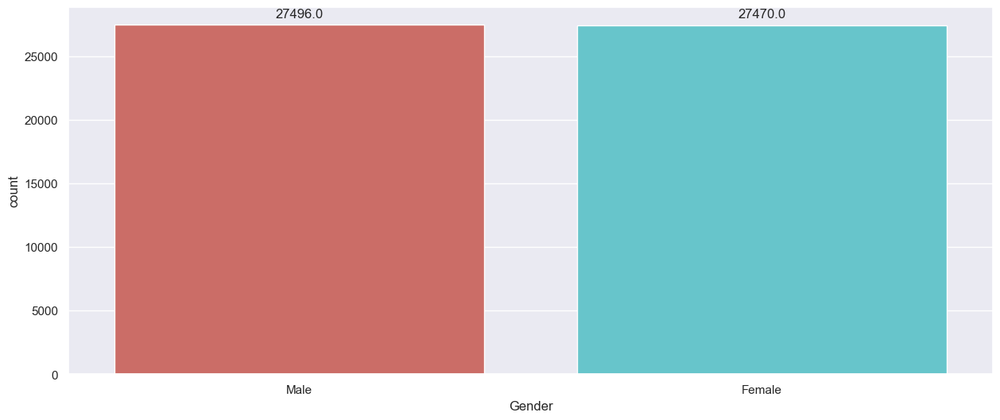

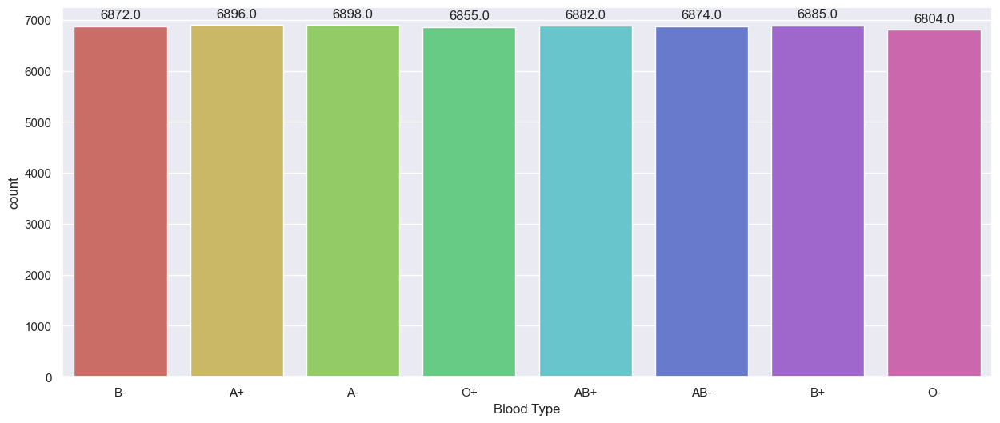

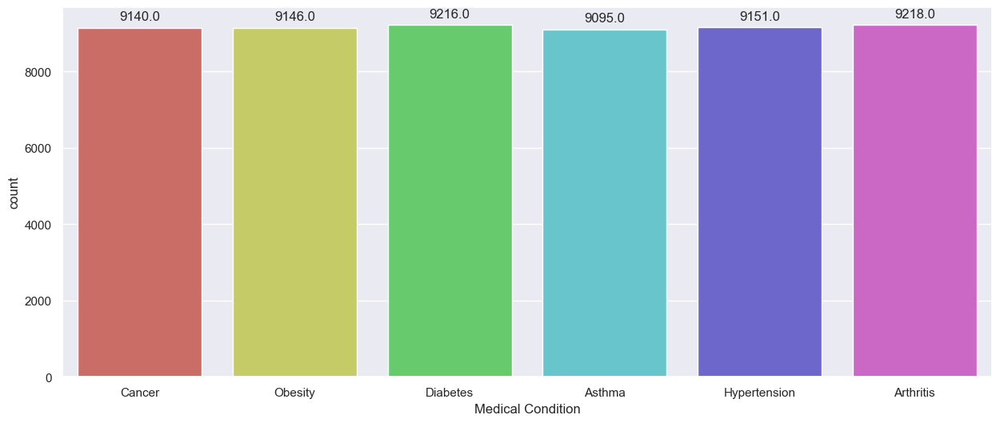

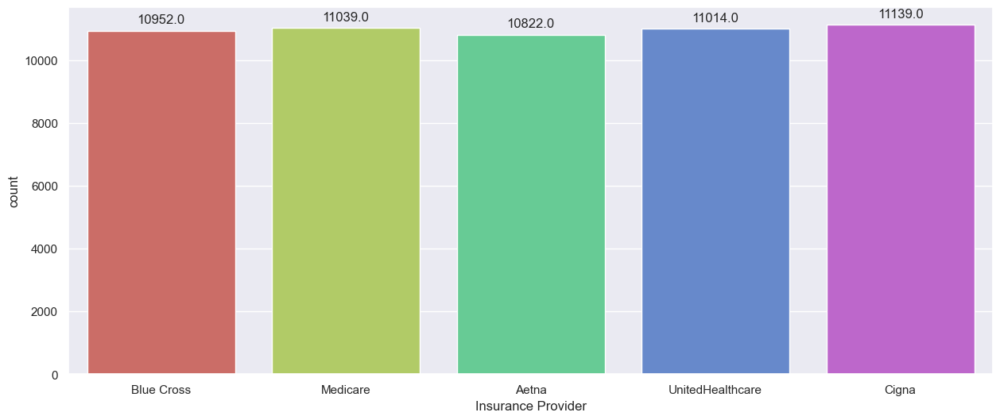

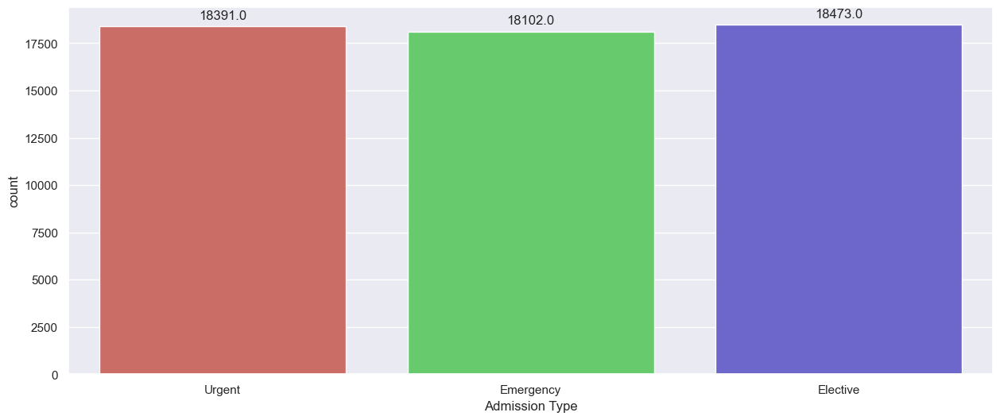

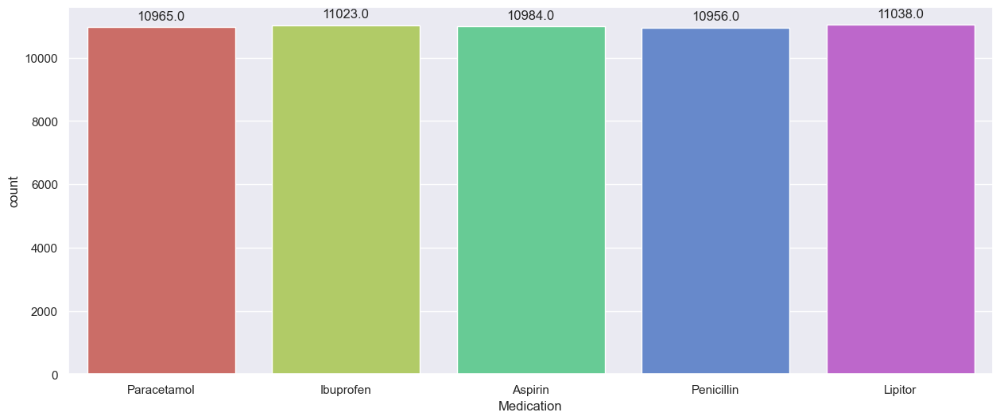

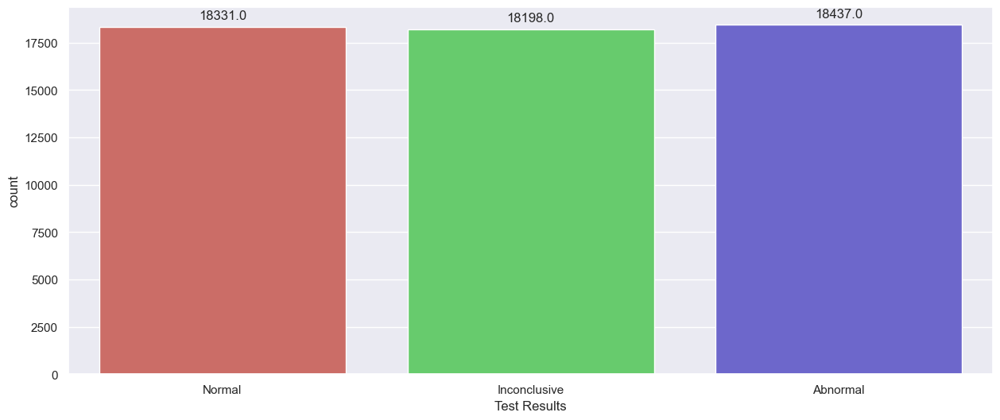

In [18]:
for i in categorical:
    plt.figure(figsize=(15,6))
    ax = sns.countplot(x=i, data=df, palette='hls')
    for p in ax.patches:
        height = p.get_height()
        ax.annotate(f"{height}", 
                    xy=(p.get_x() + p.get_width() / 2., height), 
                    xytext = (0,10), 
        textcoords="offset points",
        ha="center", va="center")
    plt.show()

In [19]:
# plotting the pie chart for categorical features
import plotly.express as px

for i in categorical:
    counts = df[i].value_counts()
    fig = px.pie(counts, values = counts.values, names = counts.index,
                title = f"Distribution of {i}")
    fig.show()

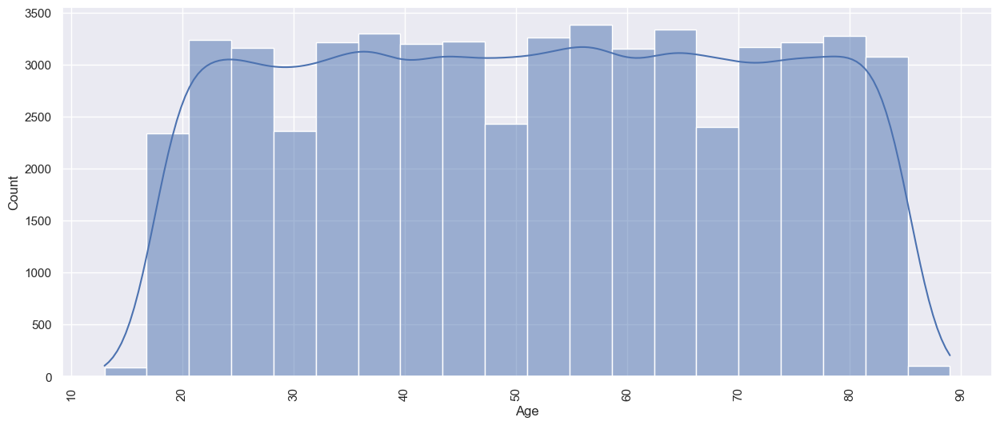

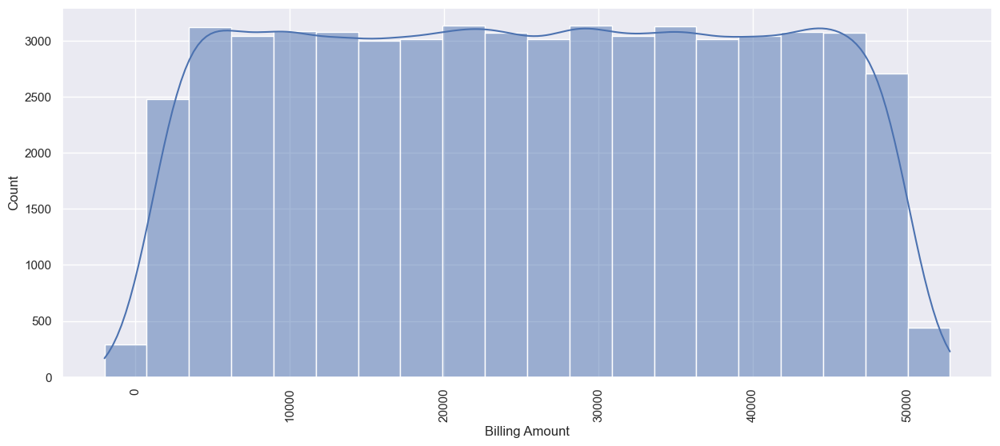

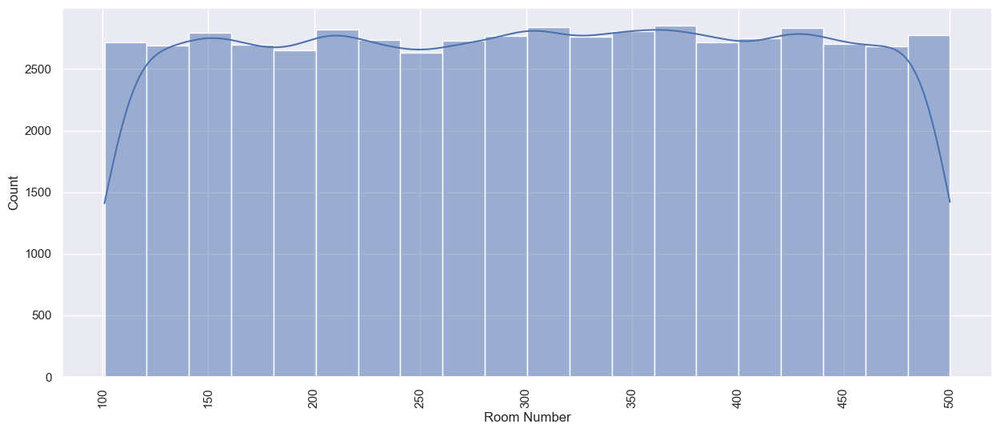

In [20]:
# For continuous feature
for i in continuous:
    plt.figure(figsize = (15,6))
    sns.histplot(data = df[i], kde = True, bins=20)
    plt.xticks(rotation = 90)
    plt.show()

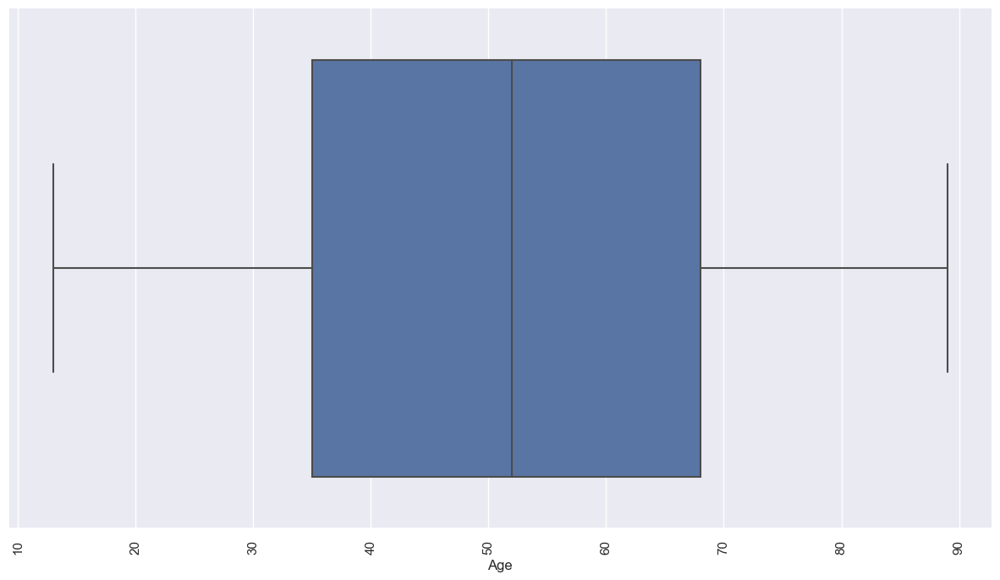

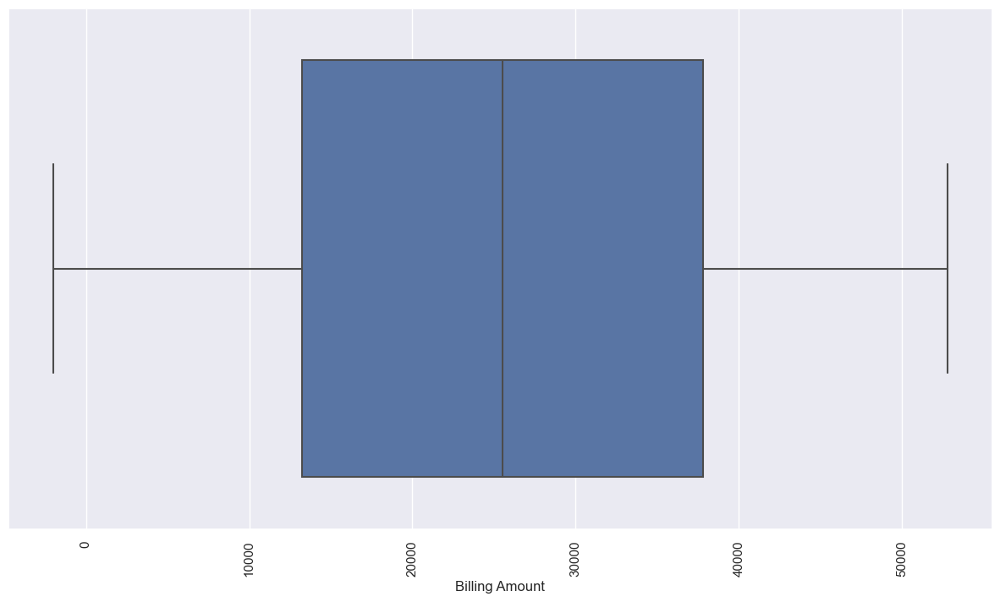

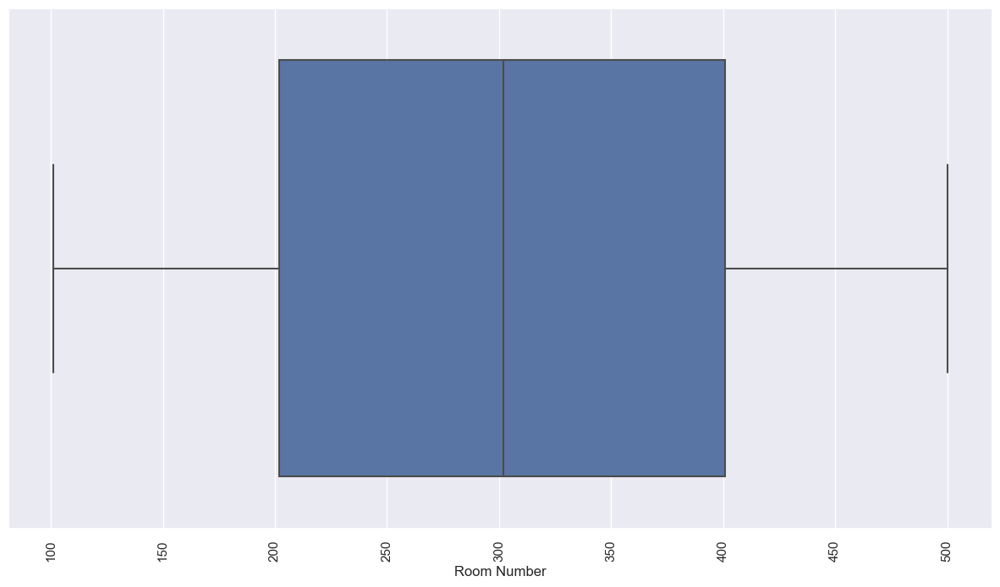

In [21]:
for i in continuous:
    plt.figure(figsize=(15,8))
    sns.boxplot(x = i, data = df)
    plt.xticks(rotation=90)
    plt.show()

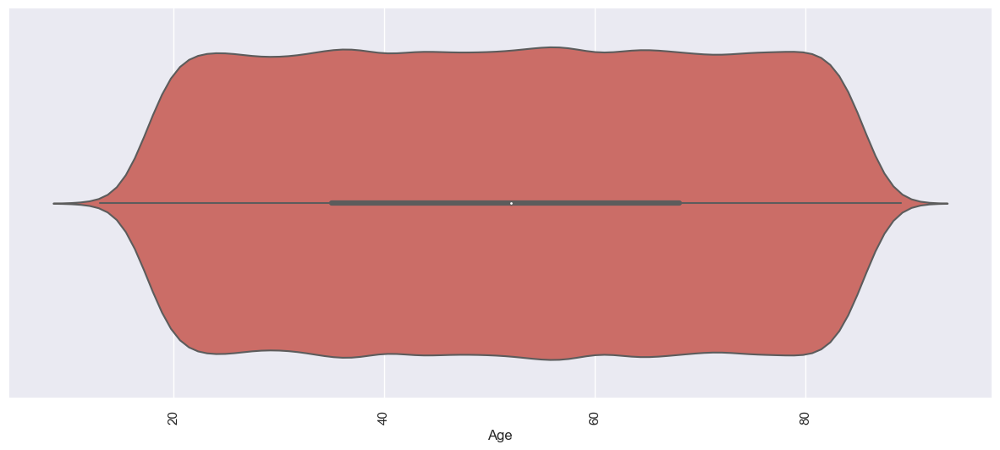

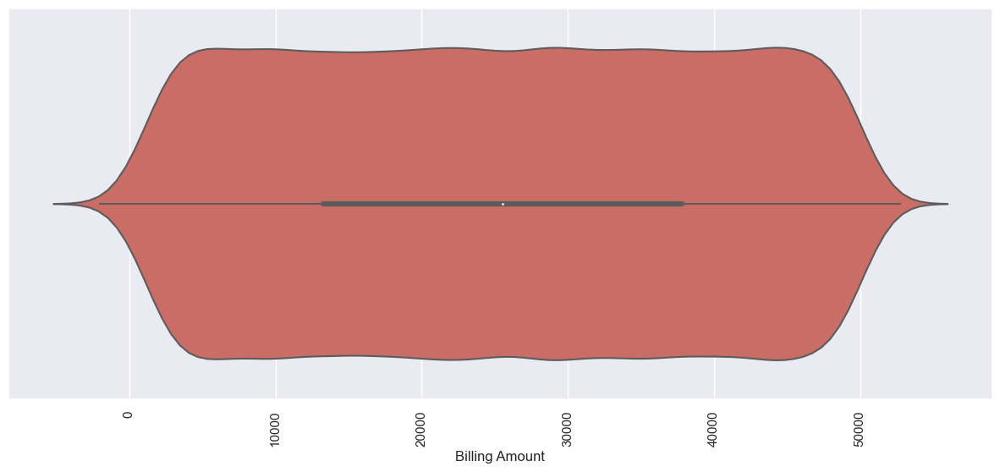

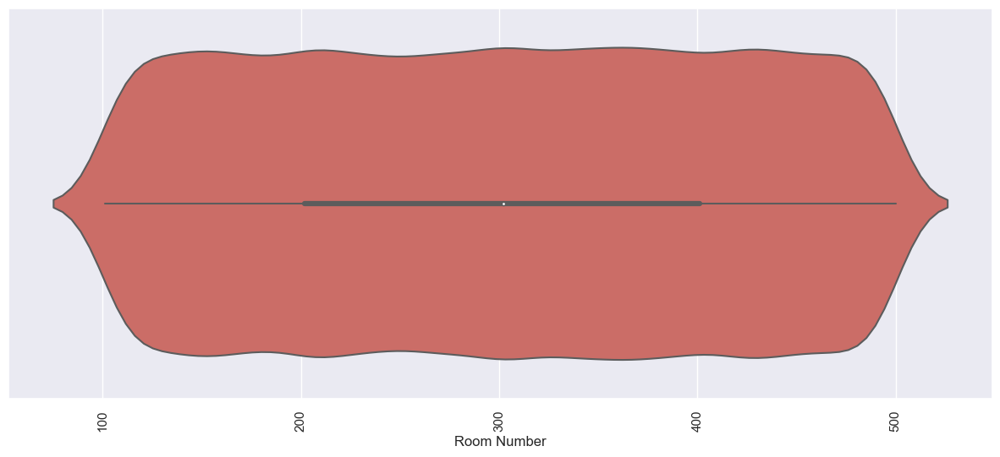

In [22]:
# plotting the violin plot for continuous features
for i in continuous:
    plt.figure(figsize=(15,6))
    sns.violinplot(data = df, x = i, palette = 'hls')
    plt.xticks(rotation = 90)
    plt.show()

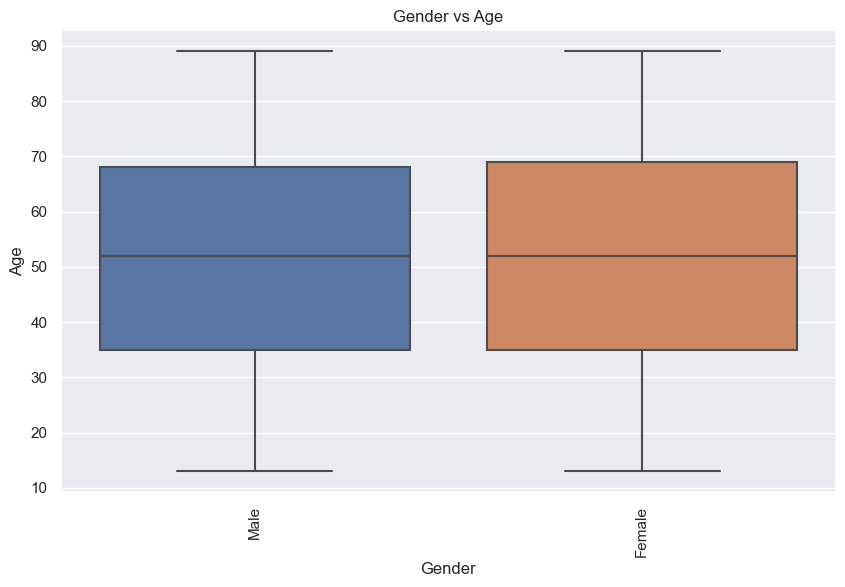

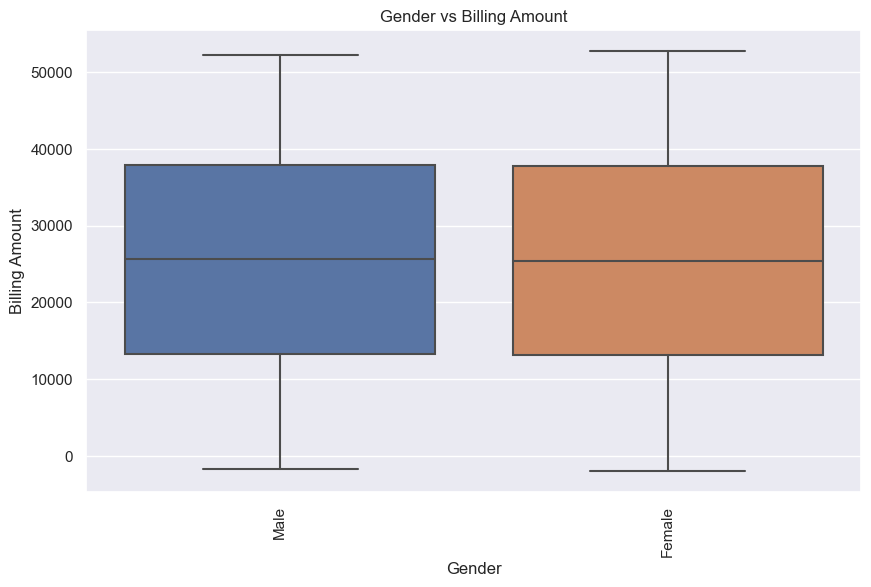

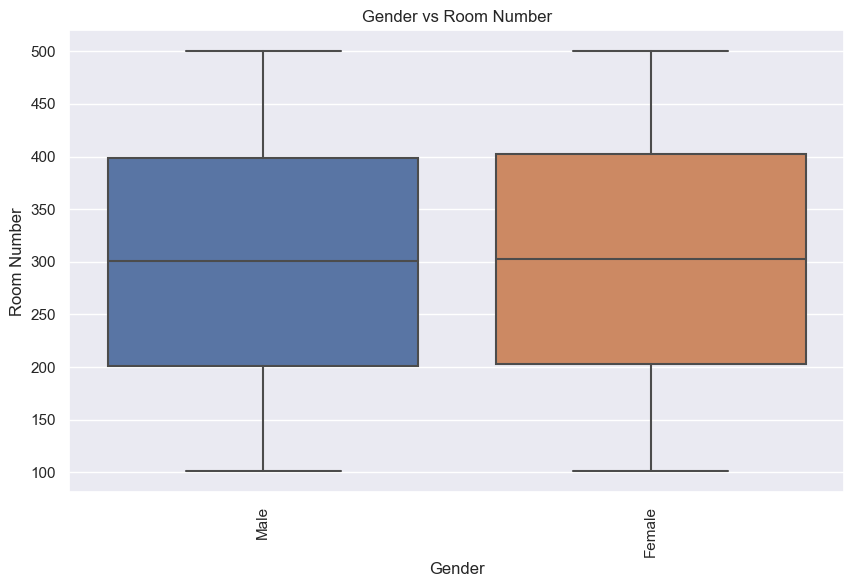

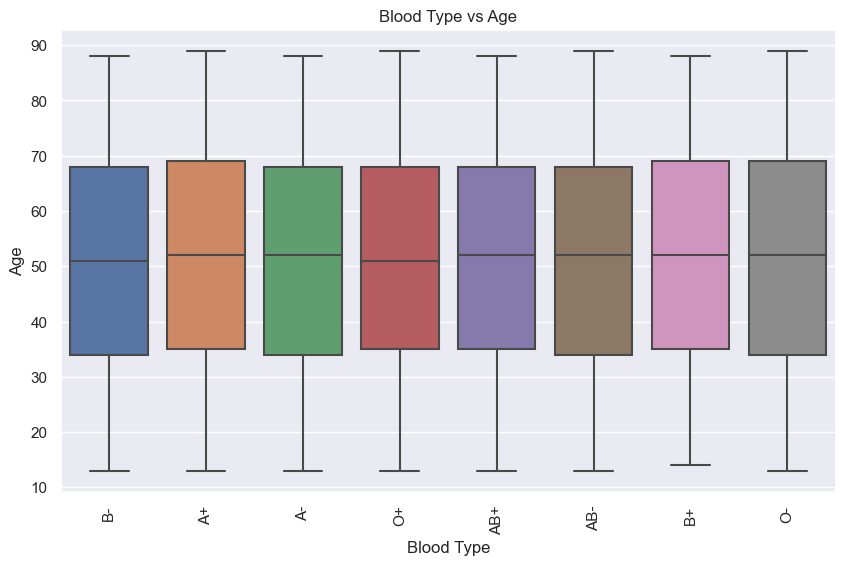

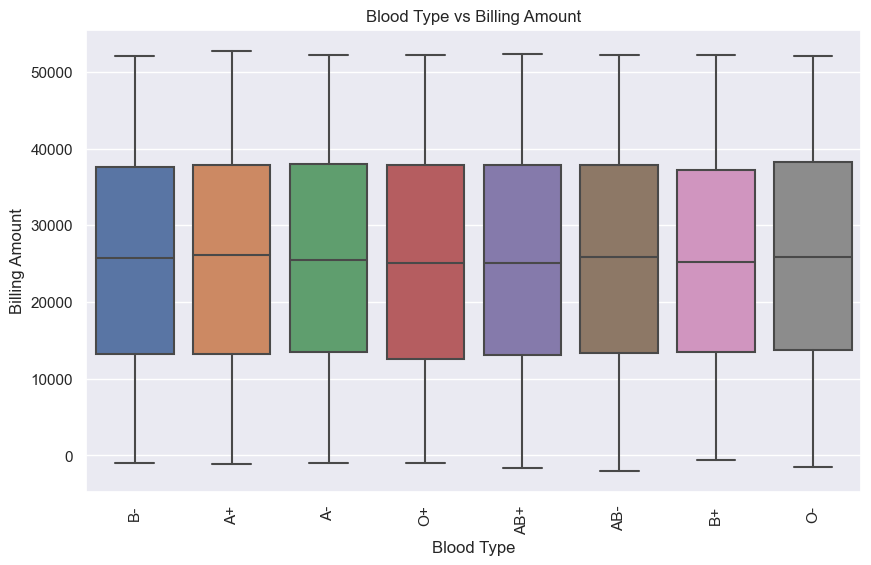

...

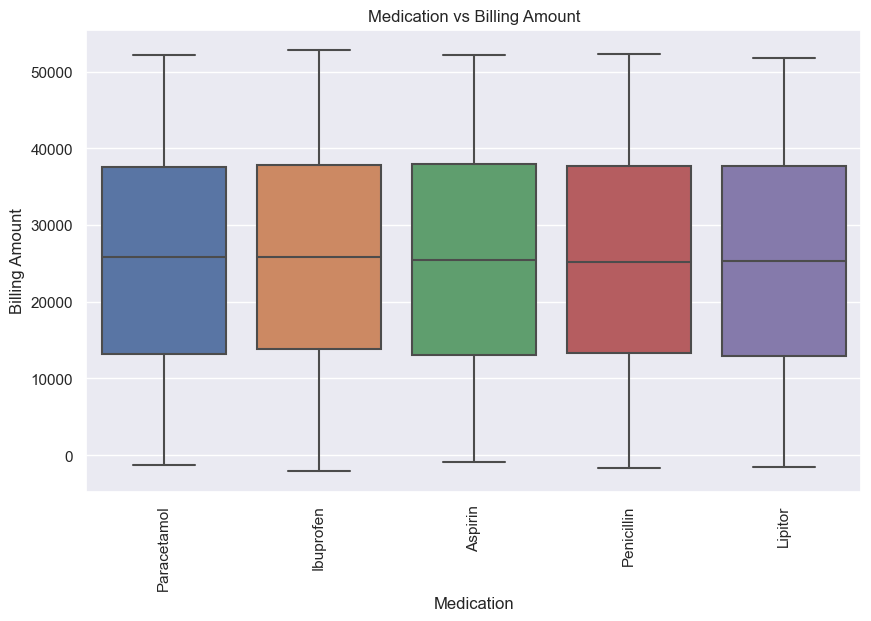

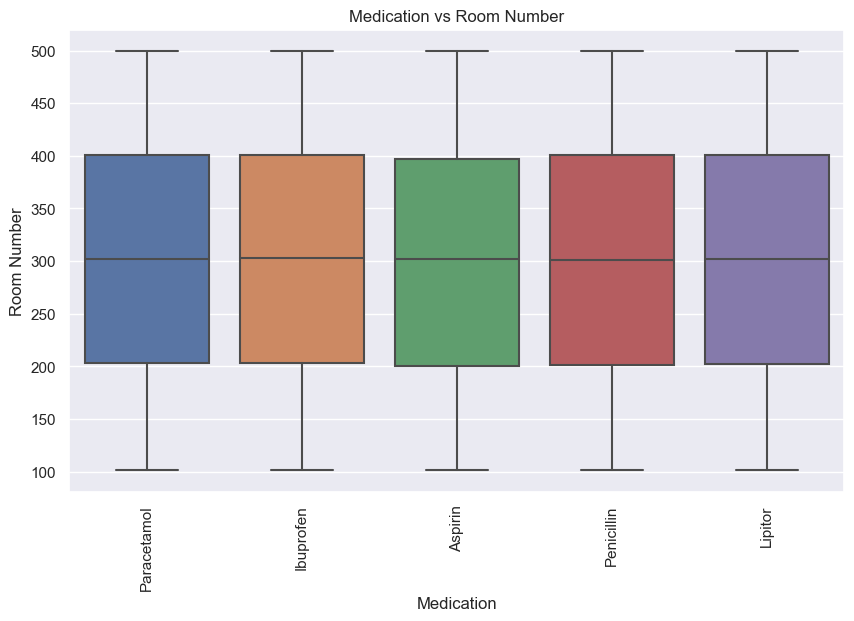

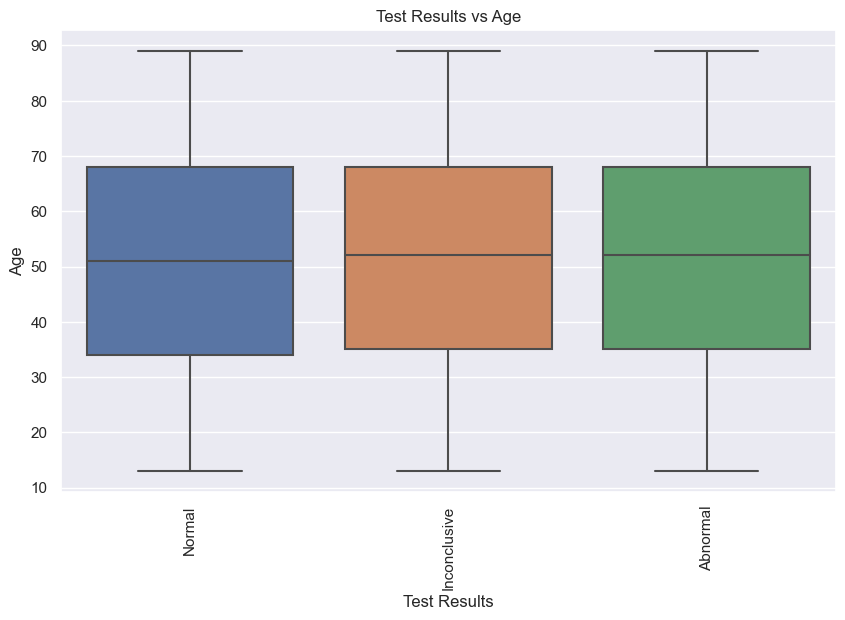

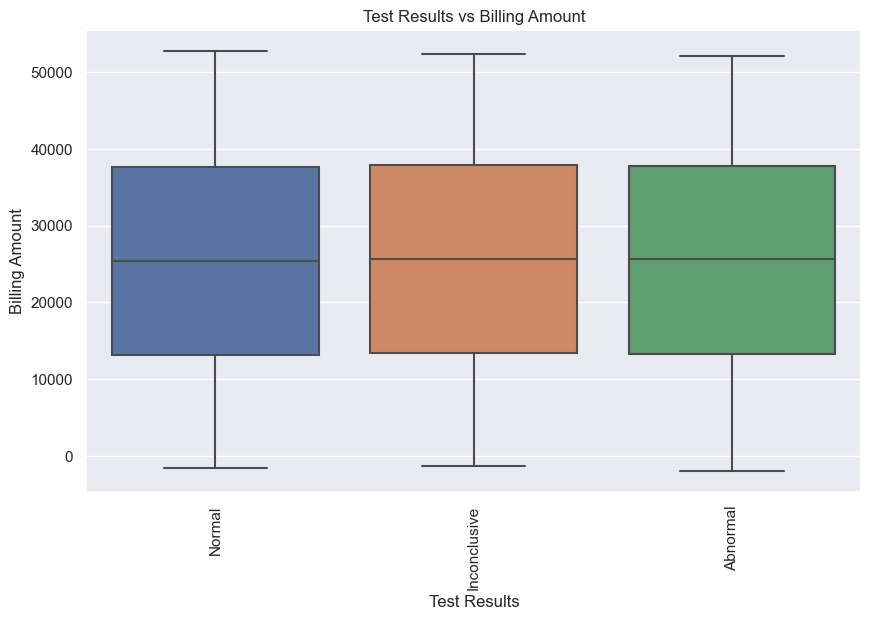

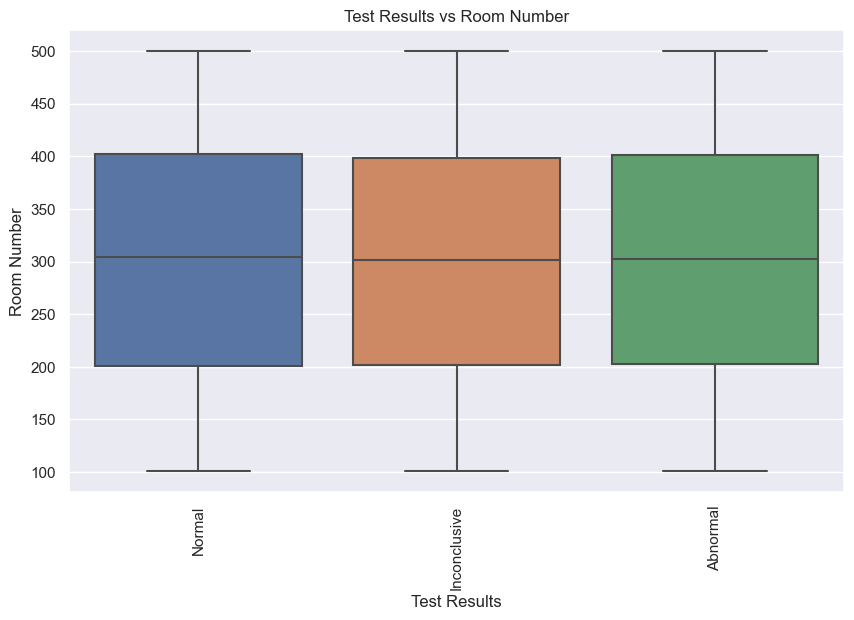

In [23]:
for dis in categorical:
    for cont in continuous:
        plt.figure(figsize=(10,6))
        ax = sns.boxplot(data=df, x=dis, y=cont)
        plt.title(f"{dis} vs {cont}")
        plt.xticks(rotation=90)
        plt.show()

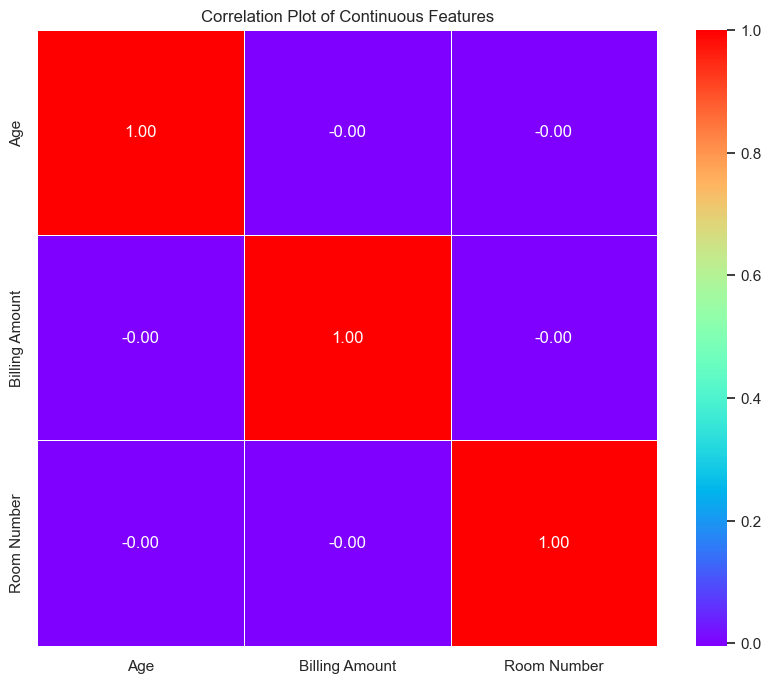

In [24]:
# plotting correlation plot for continuous features
corr_matrix = df[continuous].corr()
plt.figure(figsize=(10,8))
sns.heatmap(corr_matrix,cmap='rainbow', annot=True, fmt = '.2f',linewidths=0.5)
plt.title("Correlation Plot of Continuous Features")
plt.show()

In [25]:
corr_matrix

,Age,Billing Amount,Room Number
Age,1.000000,-0.003427,-0.000352
Billing Amount,-0.003427,1.000000,-0.003930
Room Number,-0.000352,-0.003930,1.000000


In [26]:
# ANOVA testing
from scipy.stats import f_oneway
f_stat, p_val = f_oneway(df[df['Gender'] == 'Male']['Billing Amount'],
                        df[df['Gender'] == 'Female']['Billing Amount'])
print(f"ANOVA Result : F-statistic = {f_stat}, p-value = {p_val}")

ANOVA Result : F-statistic = 1.3408137444079473, p-value = 0.24689554522480017


In [27]:
df.columns

Index(['Name', 'Age', 'Gender', 'Blood Type', 'Medical Condition',
       'Date of Admission', 'Doctor', 'Hospital', 'Insurance Provider',
       'Billing Amount', 'Room Number', 'Admission Type', 'Discharge Date',
       'Medication', 'Test Results'],
      dtype='object')

In [28]:
df['Medical Condition'].unique()

array(['Cancer', 'Obesity', 'Diabetes', 'Asthma', 'Hypertension',
       'Arthritis'], dtype=object)

In [29]:
df['Admission Type'].unique()

array(['Urgent', 'Emergency', 'Elective'], dtype=object)

In [30]:
# chi-square
from scipy.stats import chi2_contingency
contingency_table = pd.crosstab(df['Admission Type'], df['Medical Condition'])
contingency_table

Medical Condition,Arthritis,Asthma,Cancer,Diabetes,Hypertension,Obesity
Admission Type,,,,,,
Elective,3062,3069,3114,3031,3182,3015
Emergency,3073,2978,2988,2988,2975,3100
Urgent,3083,3048,3038,3197,2994,3031


In [31]:
chi2, p, dof, ex = chi2_contingency(contingency_table)
print(f"Chi-Square test result : chi2 = {chi2}, p-value = {p}")

Chi-Square test result : chi2 = 17.8903466905814, p-value = 0.05684174826535973


In [32]:
df.columns

Index(['Name', 'Age', 'Gender', 'Blood Type', 'Medical Condition',
       'Date of Admission', 'Doctor', 'Hospital', 'Insurance Provider',
       'Billing Amount', 'Room Number', 'Admission Type', 'Discharge Date',
       'Medication', 'Test Results'],
      dtype='object')

In [33]:
# plotting ploty 3d_scatter plot 
fig = px.scatter_3d(df, x='Age', y='Billing Amount' , z='Room Number', color='Gender')
fig.show()

In [34]:
df.columns

Index(['Name', 'Age', 'Gender', 'Blood Type', 'Medical Condition',
       'Date of Admission', 'Doctor', 'Hospital', 'Insurance Provider',
       'Billing Amount', 'Room Number', 'Admission Type', 'Discharge Date',
       'Medication', 'Test Results'],
      dtype='object')

In [35]:
pivot_table = pd.pivot_table(df, values = ['Billing Amount','Age'],
                            index = ['Gender','Medical Condition','Admission Type'],
                            aggfunc = {'Billing Amount':'mean', 'Age':'mean'})
pivot_table

Age  Billing Amount
Gender Medical Condition Admission Type                           
Female Arthritis         Elective        50.254990    25414.144607
                         Emergency       51.998072    25036.389922
                         Urgent          51.994129    25564.679900
       Asthma            Elective        51.147573    25490.918214
                         Emergency       51.568047    25468.207193
                         Urgent          52.420761    25101.857316
       Cancer            Elective        52.092208    25312.309738
                         Emergency       50.736944    25097.513220
                         Urgent          51.152542    25451.511538
       Diabetes          Elective        51.024918    25709.493051
                         Emergency       51.980731    25565.425113
                         Urgent          51.797973    25404.787550
       Hypertension      Elective        52.416406    25529.889579
                         Emergency       51.614353    25118.920307
                         Urgent          52.363268    25650.239970
       Obesity           Elective        52.106509    25465.834357
                         Emergency       51.024643    26392.463194
                         Urgent          50.866225    25746.819797
Male   Arthritis         Elective        51.591120    25546.952631
                         Emergency       51.445616    25969.665058
                         Urgent          51.963871    25552.155465
       Asthma            Elective        51.488845    25013.631482
                         Emergency       52.054907    26337.884796
                         Urgent          50.992514    26355.873985
       Cancer            Elective        51.183609    26023.609166
                         Emergency       52.953375    24618.664505
                         Urgent          51.230326    24379.955530
       Diabetes          Elective        51.297477    26358.827135
                         Emergency       51.469993    25376.403502
                         Urgent          51.891842    25562.589495
       Hypertension      Elective        50.913565    25580.478874
                         Emergency       50.720350    25825.482969
                         Urgent          52.272307    25311.874010
       Obesity           Elective        51.711513    25913.641197
                         Emergency       51.019897    25254.517370
                         Urgent          50.684418    26059.675047

In [36]:
pivot_table_sum = pd.pivot_table(df, values = ['Billing Amount'],
                                index = ['Insurance Provider','Test Results'],
                                aggfunc = 'sum', margins=True)
pivot_table_sum

Billing Amount
Insurance Provider Test Results                
Aetna              Abnormal        9.171489e+07
                   Inconclusive    9.330576e+07
                   Normal          9.147809e+07
Blue Cross         Abnormal        9.248506e+07
                   Inconclusive    9.548302e+07
                   Normal          9.244101e+07
Cigna              Abnormal        9.562466e+07
                   Inconclusive    9.488665e+07
                   Normal          9.382279e+07
Medicare           Abnormal        9.634342e+07
                   Inconclusive    9.258157e+07
                   Normal          9.398603e+07
UnitedHealthcare   Abnormal        9.478735e+07
                   Inconclusive    9.029127e+07
                   Normal          9.483675e+07
All                                1.404068e+09

In [37]:
pivot_table_multi = pd.pivot_table(df, values = ['Billing Amount'],
                                  index = ['Medical Condition','Gender'],
                                  aggfunc = ['sum','mean','count','min','max'],
                                  margins = True)
pivot_table_multi

sum           mean          count  \
                         Billing Amount Billing Amount Billing Amount   
Medical Condition Gender                                                
Arthritis         Female   1.176154e+08   25337.234722           4642   
                  Male     1.175522e+08   25688.849297           4576   
Asthma            Female   1.143928e+08   25358.633474           4511   
                  Male     1.187435e+08   25903.913291           4584   
Cancer            Female   1.154482e+08   25284.314393           4566   
                  Male     1.144441e+08   25020.562355           4574   
Diabetes          Female   1.177971e+08   25558.060586           4609   
                  Male     1.186899e+08   25762.941147           4607   
Hypertension      Female   1.162115e+08   25434.788625           4569   
                  Male     1.171669e+08   25571.135120           4582   
Obesity           Female   1.183084e+08   25871.071549           4573   
                  Male     1.176983e+08   25737.652254           4573   
All                        1.404068e+09   25544.306284          54966   

                                    min            max  
                         Billing Amount Billing Amount  
Medical Condition Gender                                
Arthritis         Female    -964.798619    52170.03685  
                  Male     -1129.997176    51975.96814  
Asthma            Female   -1306.662189    52181.83779  
                  Male     -1520.420555    51336.22121  
Cancer            Female   -2008.492140    52373.03237  
                  Male     -1277.645337    52092.66990  
Diabetes          Female    -860.617987    52211.85297  
                  Male     -1316.618581    51848.20160  
Hypertension      Female    -652.181369    52764.27674  
                  Male     -1660.009373    52271.66375  
Obesity           Female    -967.594706    51501.64977  
                  Male     -1310.272895    52024.72644  
All                        -2008.492140    52764.27674

In [38]:
Grouped_data = df.groupby(['Gender','Medical Condition'])[['Billing Amount','Age']].mean()
Grouped_data

Billing Amount        Age
Gender Medical Condition                           
Female Arthritis            25337.234722  51.413615
       Asthma               25358.633474  51.697185
       Cancer               25284.314393  51.328296
       Diabetes             25558.060586  51.601866
       Hypertension         25434.788625  52.137448
       Obesity              25871.071549  51.332167
Male   Arthritis            25688.849297  51.669143
       Asthma               25903.913291  51.495201
       Cancer               25020.562355  51.755575
       Diabetes             25762.941147  51.561754
       Hypertension         25571.135120  51.299651
       Obesity              25737.652254  51.134266

In [39]:
grouped_data_custom = df.groupby('Admission Type')['Billing Amount'].agg([('median'),
                                                                         ('std')])
grouped_data_custom

,median,std
Admission Type,,
Elective,25674.73536,14220.835323
Emergency,25413.78104,14159.764673
Urgent,25543.55847,14244.202912


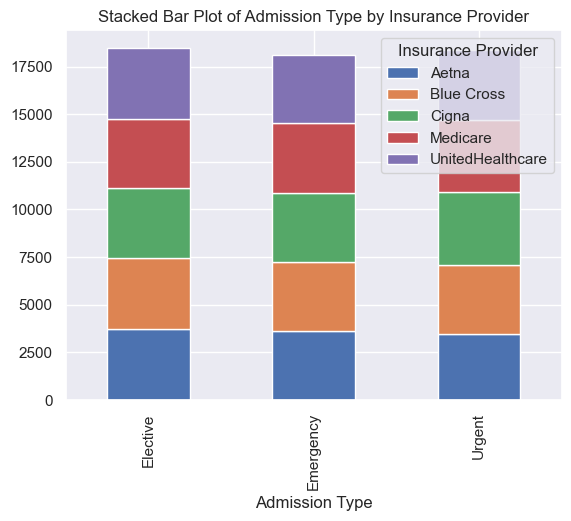

In [40]:
pd.crosstab(df['Admission Type'], df['Insurance Provider']).plot(kind='bar',stacked=True)
plt.title('Stacked Bar Plot of Admission Type by Insurance Provider')
plt.show()

In [41]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 54966 entries, 0 to 55499
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Name                54966 non-null  object 
 1   Age                 54966 non-null  int64  
 2   Gender              54966 non-null  object 
 3   Blood Type          54966 non-null  object 
 4   Medical Condition   54966 non-null  object 
 5   Date of Admission   54966 non-null  object 
 6   Doctor              54966 non-null  object 
 7   Hospital            54966 non-null  object 
 8   Insurance Provider  54966 non-null  object 
 9   Billing Amount      54966 non-null  float64
 10  Room Number         54966 non-null  int64  
 11  Admission Type      54966 non-null  object 
 12  Discharge Date      54966 non-null  object 
 13  Medication          54966 non-null  object 
 14  Test Results        54966 non-null  object 
dtypes: float64(1), int64(2), object(12)
memory usage: 6.7+ MB


In [42]:
# converting Date of Admission datatype to datetime
df['Date of Admission'] = pd.to_datetime(df['Date of Admission'])

In [43]:
# splitting it into day,month and year
df['Admission Day'] = df['Date of Admission'].dt.day
df['Admission Month'] = df['Date of Admission'].dt.month
df['Admission Year'] = df['Date of Admission'].dt.year

In [44]:
df.head()

,Name,Age,Gender,Blood Type,Medical Condition,Date of Admission,Doctor,Hospital,Insurance Provider,Billing Amount,Room Number,Admission Type,Discharge Date,Medication,Test Results,Admission Day,Admission Month,Admission Year
0,Bobby JacksOn,30,Male,B-,Cancer,2024-01-31,Matthew Smith,Sons and Miller,Blue Cross,18856.28131,328,Urgent,02-02-2024,Paracetamol,Normal,31,1,2024
1,LesLie TErRy,62,Male,A+,Obesity,2019-08-20,Samantha Davies,Kim Inc,Medicare,33643.32729,265,Emergency,26-08-2019,Ibuprofen,Inconclusive,20,8,2019
2,DaNnY sMitH,76,Female,A-,Obesity,2022-09-22,Tiffany Mitchell,Cook PLC,Aetna,27955.09608,205,Emergency,07-10-2022,Aspirin,Normal,22,9,2022
3,andrEw waTtS,28,Female,O+,Diabetes,2020-11-18,Kevin Wells,"Hernandez Rogers and Vang,",Medicare,37909.78241,450,Elective,18-12-2020,Ibuprofen,Abnormal,18,11,2020
4,adrIENNE bEll,43,Female,AB+,Cancer,2022-09-19,Kathleen Hanna,White-White,Aetna,14238.31781,458,Urgent,09-10-2022,Penicillin,Abnormal,19,9,2022


In [45]:
# converting Discharge Date datatype to datetime
df['Discharge Date'] = pd.to_datetime(df['Discharge Date'], format='%d-%m-%Y')

In [46]:
# splitting the Discharge Date into day,month and year
df['Discharge Day'] = df['Discharge Date'].dt.day
df['Discharfe Month'] = df['Discharge Date'].dt.month
df['Discharge Year'] = df['Discharge Date'].dt.year

In [47]:
df.head()

,Name,Age,Gender,Blood Type,Medical Condition,Date of Admission,Doctor,Hospital,Insurance Provider,Billing Amount,...,Admission Type,Discharge Date,Medication,Test Results,Admission Day,Admission Month,Admission Year,Discharge Day,Discharfe Month,Discharge Year
0,Bobby JacksOn,30,Male,B-,Cancer,2024-01-31,Matthew Smith,Sons and Miller,Blue Cross,18856.28131,...,Urgent,2024-02-02,Paracetamol,Normal,31,1,2024,2,2,2024
1,LesLie TErRy,62,Male,A+,Obesity,2019-08-20,Samantha Davies,Kim Inc,Medicare,33643.32729,...,Emergency,2019-08-26,Ibuprofen,Inconclusive,20,8,2019,26,8,2019
2,DaNnY sMitH,76,Female,A-,Obesity,2022-09-22,Tiffany Mitchell,Cook PLC,Aetna,27955.09608,...,Emergency,2022-10-07,Aspirin,Normal,22,9,2022,7,10,2022
3,andrEw waTtS,28,Female,O+,Diabetes,2020-11-18,Kevin Wells,"Hernandez Rogers and Vang,",Medicare,37909.78241,...,Elective,2020-12-18,Ibuprofen,Abnormal,18,11,2020,18,12,2020
4,adrIENNE bEll,43,Female,AB+,Cancer,2022-09-19,Kathleen Hanna,White-White,Aetna,14238.31781,...,Urgent,2022-10-09,Penicillin,Abnormal,19,9,2022,9,10,2022


In [48]:
# creating 'Days' column which will tell how many days the patient was admitted
df['Days'] = df['Discharge Date'] - df['Date of Admission']
df.head()

,Name,Age,Gender,Blood Type,Medical Condition,Date of Admission,Doctor,Hospital,Insurance Provider,Billing Amount,...,Discharge Date,Medication,Test Results,Admission Day,Admission Month,Admission Year,Discharge Day,Discharfe Month,Discharge Year,Days
0,Bobby JacksOn,30,Male,B-,Cancer,2024-01-31,Matthew Smith,Sons and Miller,Blue Cross,18856.28131,...,2024-02-02,Paracetamol,Normal,31,1,2024,2,2,2024,2 days
1,LesLie TErRy,62,Male,A+,Obesity,2019-08-20,Samantha Davies,Kim Inc,Medicare,33643.32729,...,2019-08-26,Ibuprofen,Inconclusive,20,8,2019,26,8,2019,6 days
2,DaNnY sMitH,76,Female,A-,Obesity,2022-09-22,Tiffany Mitchell,Cook PLC,Aetna,27955.09608,...,2022-10-07,Aspirin,Normal,22,9,2022,7,10,2022,15 days
3,andrEw waTtS,28,Female,O+,Diabetes,2020-11-18,Kevin Wells,"Hernandez Rogers and Vang,",Medicare,37909.78241,...,2020-12-18,Ibuprofen,Abnormal,18,11,2020,18,12,2020,30 days
4,adrIENNE bEll,43,Female,AB+,Cancer,2022-09-19,Kathleen Hanna,White-White,Aetna,14238.31781,...,2022-10-09,Penicillin,Abnormal,19,9,2022,9,10,2022,20 days


In [49]:
df.columns

Index(['Name', 'Age', 'Gender', 'Blood Type', 'Medical Condition',
       'Date of Admission', 'Doctor', 'Hospital', 'Insurance Provider',
       'Billing Amount', 'Room Number', 'Admission Type', 'Discharge Date',
       'Medication', 'Test Results', 'Admission Day', 'Admission Month',
       'Admission Year', 'Discharge Day', 'Discharfe Month', 'Discharge Year',
       'Days'],
      dtype='object')

In [50]:
# dropping the columns
df = df.drop(columns = ['Name','Date of Admission','Doctor','Hospital','Insurance Provider',
                       'Room Number','Discharge Date'], axis=1)

In [51]:
df.head()

,Age,Gender,Blood Type,Medical Condition,Billing Amount,Admission Type,Medication,Test Results,Admission Day,Admission Month,Admission Year,Discharge Day,Discharfe Month,Discharge Year,Days
0,30,Male,B-,Cancer,18856.28131,Urgent,Paracetamol,Normal,31,1,2024,2,2,2024,2 days
1,62,Male,A+,Obesity,33643.32729,Emergency,Ibuprofen,Inconclusive,20,8,2019,26,8,2019,6 days
2,76,Female,A-,Obesity,27955.09608,Emergency,Aspirin,Normal,22,9,2022,7,10,2022,15 days
3,28,Female,O+,Diabetes,37909.78241,Elective,Ibuprofen,Abnormal,18,11,2020,18,12,2020,30 days
4,43,Female,AB+,Cancer,14238.31781,Urgent,Penicillin,Abnormal,19,9,2022,9,10,2022,20 days


In [52]:
df.columns

Index(['Age', 'Gender', 'Blood Type', 'Medical Condition', 'Billing Amount',
       'Admission Type', 'Medication', 'Test Results', 'Admission Day',
       'Admission Month', 'Admission Year', 'Discharge Day', 'Discharfe Month',
       'Discharge Year', 'Days'],
      dtype='object')

In [53]:
df = df.drop(columns = ['Billing Amount','Admission Day','Admission Month', 'Admission Year', 'Discharge Day', 'Discharfe Month',
       'Discharge Year'], axis=1)

In [54]:
df.head()

,Age,Gender,Blood Type,Medical Condition,Admission Type,Medication,Test Results,Days
0,30,Male,B-,Cancer,Urgent,Paracetamol,Normal,2 days
1,62,Male,A+,Obesity,Emergency,Ibuprofen,Inconclusive,6 days
2,76,Female,A-,Obesity,Emergency,Aspirin,Normal,15 days
3,28,Female,O+,Diabetes,Elective,Ibuprofen,Abnormal,30 days
4,43,Female,AB+,Cancer,Urgent,Penicillin,Abnormal,20 days


In [55]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 54966 entries, 0 to 55499
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype          
---  ------             --------------  -----          
 0   Age                54966 non-null  int64          
 1   Gender             54966 non-null  object         
 2   Blood Type         54966 non-null  object         
 3   Medical Condition  54966 non-null  object         
 4   Admission Type     54966 non-null  object         
 5   Medication         54966 non-null  object         
 6   Test Results       54966 non-null  object         
 7   Days               54966 non-null  timedelta64[ns]
dtypes: int64(1), object(6), timedelta64[ns](1)
memory usage: 3.8+ MB


In [56]:
# converting Days datatype into str
df['Days'] = df['Days'].astype(str)
# creating new column of Days_numeric
df['Days_numeric'] = df['Days'].str.split().str[0].astype(int)

In [57]:
df['Days_numeric'].nunique()

30

In [58]:
df.head()

,Age,Gender,Blood Type,Medical Condition,Admission Type,Medication,Test Results,Days,Days_numeric
0,30,Male,B-,Cancer,Urgent,Paracetamol,Normal,2 days,2
1,62,Male,A+,Obesity,Emergency,Ibuprofen,Inconclusive,6 days,6
2,76,Female,A-,Obesity,Emergency,Aspirin,Normal,15 days,15
3,28,Female,O+,Diabetes,Elective,Ibuprofen,Abnormal,30 days,30
4,43,Female,AB+,Cancer,Urgent,Penicillin,Abnormal,20 days,20


In [59]:
# dropping Days column because we created the Days_numeric
df = df.drop('Days',axis=1)

In [60]:
df.head()

,Age,Gender,Blood Type,Medical Condition,Admission Type,Medication,Test Results,Days_numeric
0,30,Male,B-,Cancer,Urgent,Paracetamol,Normal,2
1,62,Male,A+,Obesity,Emergency,Ibuprofen,Inconclusive,6
2,76,Female,A-,Obesity,Emergency,Aspirin,Normal,15
3,28,Female,O+,Diabetes,Elective,Ibuprofen,Abnormal,30
4,43,Female,AB+,Cancer,Urgent,Penicillin,Abnormal,20


In [61]:
# checking the which are categorical,non_categorical,discrete,continuous features
categorical, non_categorical, discrete, continuous = classify_features(df)

In [62]:
print("Categorical Features :", categorical)
print()
print("Non-Categorical Features :", non_categorical)
print()
print("Discrete Features :", discrete)
print()
print("Continuous Features :", continuous)

Categorical Features : ['Gender', 'Blood Type', 'Medical Condition', 'Admission Type', 'Medication', 'Test Results']

Non-Categorical Features : []

Discrete Features : []

Continuous Features : ['Age']


In [63]:
# not considering the 'Test Results' it is dependent variable.
categorical_features = ['Gender', 'Blood Type', 'Medical Condition', 'Admission Type', 'Medication']

In [64]:
categorical_features

['Gender', 'Blood Type', 'Medical Condition', 'Admission Type', 'Medication']

In [65]:
# doing One-Hot-Encoder on categorical_features
df_dummies = pd.get_dummies(df[categorical_features], drop_first=True,dtype=int)
df_dummies

,Gender_Male,Blood Type_A-,Blood Type_AB+,Blood Type_AB-,Blood Type_B+,Blood Type_B-,Blood Type_O+,Blood Type_O-,Medical Condition_Asthma,Medical Condition_Cancer,Medical Condition_Diabetes,Medical Condition_Hypertension,Medical Condition_Obesity,Admission Type_Emergency,Admission Type_Urgent,Medication_Ibuprofen,Medication_Lipitor,Medication_Paracetamol,Medication_Penicillin
0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0
1,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0
2,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0
3,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0
4,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55495,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1
55496,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
55497,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,1,0,0,0
55498,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0


In [66]:
df.head()

,Age,Gender,Blood Type,Medical Condition,Admission Type,Medication,Test Results,Days_numeric
0,30,Male,B-,Cancer,Urgent,Paracetamol,Normal,2
1,62,Male,A+,Obesity,Emergency,Ibuprofen,Inconclusive,6
2,76,Female,A-,Obesity,Emergency,Aspirin,Normal,15
3,28,Female,O+,Diabetes,Elective,Ibuprofen,Abnormal,30
4,43,Female,AB+,Cancer,Urgent,Penicillin,Abnormal,20


In [67]:
# concating the df_dummies with df
df = pd.concat([df.drop(columns=categorical_features), df_dummies], axis=1)

In [68]:
df.head()

,Age,Test Results,Days_numeric,Gender_Male,Blood Type_A-,Blood Type_AB+,Blood Type_AB-,Blood Type_B+,Blood Type_B-,Blood Type_O+,...,Medical Condition_Cancer,Medical Condition_Diabetes,Medical Condition_Hypertension,Medical Condition_Obesity,Admission Type_Emergency,Admission Type_Urgent,Medication_Ibuprofen,Medication_Lipitor,Medication_Paracetamol,Medication_Penicillin
0,30,Normal,2,1,0,0,0,0,1,0,...,1,0,0,0,0,1,0,0,1,0
1,62,Inconclusive,6,1,0,0,0,0,0,0,...,0,0,0,1,1,0,1,0,0,0
2,76,Normal,15,0,1,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0
3,28,Abnormal,30,0,0,0,0,0,0,1,...,0,1,0,0,0,0,1,0,0,0
4,43,Abnormal,20,0,0,1,0,0,0,0,...,1,0,0,0,0,1,0,0,0,1


In [69]:
# checking the dependent variable value_count
df['Test Results'].value_counts()

Test Results
Abnormal        18437
Normal          18331
Inconclusive    18198
Name: count, dtype: int64

In [70]:
# converting Test Results into number format
test_result_mapping = {'Normal':0,'Abnormal':1,'Inconclusive':2}

In [71]:
# creating new_feature and replacing test_results with test_result_mapping
df['Test_Result_Numeric'] = df['Test Results'].replace(test_result_mapping)

In [72]:
df.head()

,Age,Test Results,Days_numeric,Gender_Male,Blood Type_A-,Blood Type_AB+,Blood Type_AB-,Blood Type_B+,Blood Type_B-,Blood Type_O+,...,Medical Condition_Diabetes,Medical Condition_Hypertension,Medical Condition_Obesity,Admission Type_Emergency,Admission Type_Urgent,Medication_Ibuprofen,Medication_Lipitor,Medication_Paracetamol,Medication_Penicillin,Test_Result_Numeric
0,30,Normal,2,1,0,0,0,0,1,0,...,0,0,0,0,1,0,0,1,0,0
1,62,Inconclusive,6,1,0,0,0,0,0,0,...,0,0,1,1,0,1,0,0,0,2
2,76,Normal,15,0,1,0,0,0,0,0,...,0,0,1,1,0,0,0,0,0,0
3,28,Abnormal,30,0,0,0,0,0,0,1,...,1,0,0,0,0,1,0,0,0,1
4,43,Abnormal,20,0,0,1,0,0,0,0,...,0,0,0,0,1,0,0,0,1,1


In [73]:
# drop Test Results
df = df.drop('Test Results', axis=1)

In [74]:
df.head()

,Age,Days_numeric,Gender_Male,Blood Type_A-,Blood Type_AB+,Blood Type_AB-,Blood Type_B+,Blood Type_B-,Blood Type_O+,Blood Type_O-,...,Medical Condition_Diabetes,Medical Condition_Hypertension,Medical Condition_Obesity,Admission Type_Emergency,Admission Type_Urgent,Medication_Ibuprofen,Medication_Lipitor,Medication_Paracetamol,Medication_Penicillin,Test_Result_Numeric
0,30,2,1,0,0,0,0,1,0,0,...,0,0,0,0,1,0,0,1,0,0
1,62,6,1,0,0,0,0,0,0,0,...,0,0,1,1,0,1,0,0,0,2
2,76,15,0,1,0,0,0,0,0,0,...,0,0,1,1,0,0,0,0,0,0
3,28,30,0,0,0,0,0,0,1,0,...,1,0,0,0,0,1,0,0,0,1
4,43,20,0,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,1


In [75]:
# spiltting the data into dependent and independent variable
x = df.drop('Test_Result_Numeric', axis=1)
y = df['Test_Result_Numeric']

In [76]:
x.head()

,Age,Days_numeric,Gender_Male,Blood Type_A-,Blood Type_AB+,Blood Type_AB-,Blood Type_B+,Blood Type_B-,Blood Type_O+,Blood Type_O-,...,Medical Condition_Cancer,Medical Condition_Diabetes,Medical Condition_Hypertension,Medical Condition_Obesity,Admission Type_Emergency,Admission Type_Urgent,Medication_Ibuprofen,Medication_Lipitor,Medication_Paracetamol,Medication_Penicillin
0,30,2,1,0,0,0,0,1,0,0,...,1,0,0,0,0,1,0,0,1,0
1,62,6,1,0,0,0,0,0,0,0,...,0,0,0,1,1,0,1,0,0,0
2,76,15,0,1,0,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0
3,28,30,0,0,0,0,0,0,1,0,...,0,1,0,0,0,0,1,0,0,0
4,43,20,0,0,1,0,0,0,0,0,...,1,0,0,0,0,1,0,0,0,1


In [77]:
x.columns

Index(['Age', 'Days_numeric', 'Gender_Male', 'Blood Type_A-', 'Blood Type_AB+',
       'Blood Type_AB-', 'Blood Type_B+', 'Blood Type_B-', 'Blood Type_O+',
       'Blood Type_O-', 'Medical Condition_Asthma', 'Medical Condition_Cancer',
       'Medical Condition_Diabetes', 'Medical Condition_Hypertension',
       'Medical Condition_Obesity', 'Admission Type_Emergency',
       'Admission Type_Urgent', 'Medication_Ibuprofen', 'Medication_Lipitor',
       'Medication_Paracetamol', 'Medication_Penicillin'],
      dtype='object')

In [78]:
y.head()

0    0
1    2
2    0
3    1
4    1
Name: Test_Result_Numeric, dtype: int64

In [79]:
# dependent variable is balanced
df['Test_Result_Numeric'].value_counts()/len(df['Test_Result_Numeric'])*100

Test_Result_Numeric
1    33.542554
0    33.349707
2    33.107739
Name: count, dtype: float64

In [80]:
# splitting the data into train and test split
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.25, random_state=42, stratify=y)

# Building ML Models

In [81]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

## Logistic Regression Model:

In [82]:
lr_model = LogisticRegression()
lr_model.fit(x_train, y_train)

LogisticRegression()

In [83]:
# predicting the model
y_pred = lr_model.predict(x_test)
y_train_pred = lr_model.predict(x_train)

In [84]:
# evaluating the model
accuracy_train = accuracy_score(y_train, y_train_pred)
print("LR Train model accuracy :",accuracy_train)
accuracy = accuracy_score(y_test, y_pred)
print("LR Test model accuracy :",accuracy)
print()
report = classification_report(y_test, y_pred)
print('Classification Report :')
print(report)


LR Train model accuracy : 0.3428585290122259
LR Test model accuracy : 0.33583175665841947

Classification Report :
              precision    recall  f1-score   support

           0       0.33      0.36      0.34      4583
           1       0.34      0.38      0.36      4609
           2       0.33      0.27      0.30      4550

    accuracy                           0.34     13742
   macro avg       0.34      0.34      0.33     13742
weighted avg       0.34      0.34      0.33     13742



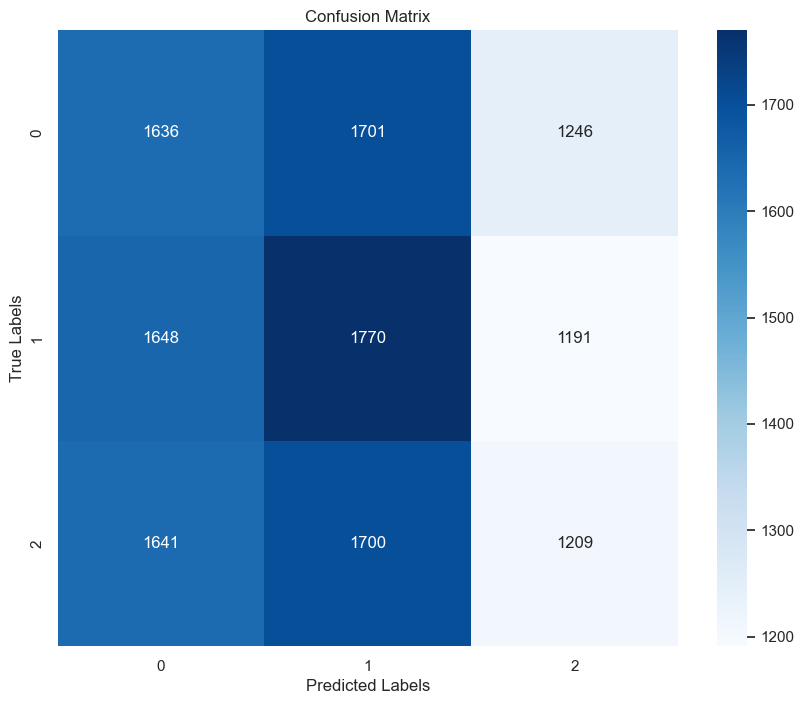

In [85]:
plt.figure(figsize=(10,8))
sns.heatmap(confusion_matrix(y_test,y_pred), annot=True, fmt='d', cmap='Blues',
           xticklabels = np.unique(y_test), yticklabels = np.unique(y_test))
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

In [86]:
#!pip install xgboost

In [87]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

In [88]:
from sklearn.ensemble import GradientBoostingClassifier

## Decision Tree Model:

In [89]:
dt_model = DecisionTreeClassifier()
dt_model.fit(x_train, y_train)

DecisionTreeClassifier()

In [90]:
# predict
y_train_pred_dt = dt_model.predict(x_train)
y_test_pred_dt = dt_model.predict(x_test)

In [91]:
# evaluating the model
accuracy_dt_train = accuracy_score(y_train, y_train_pred_dt)
print("DT Train accuracy :",accuracy_dt_train)
accuracy_dt_test = accuracy_score(y_test, y_test_pred_dt)
print("DT Test accuracy :",accuracy_dt_test)
print()
report_Dt = classification_report(y_test, y_test_pred_dt)
print("Classification Report :")
print(report_Dt)

DT Train accuracy : 0.994784591500097
DT Test accuracy : 0.36231989521175956

Classification Report :
              precision    recall  f1-score   support

           0       0.36      0.37      0.36      4583
           1       0.37      0.37      0.37      4609
           2       0.36      0.36      0.36      4550

    accuracy                           0.36     13742
   macro avg       0.36      0.36      0.36     13742
weighted avg       0.36      0.36      0.36     13742



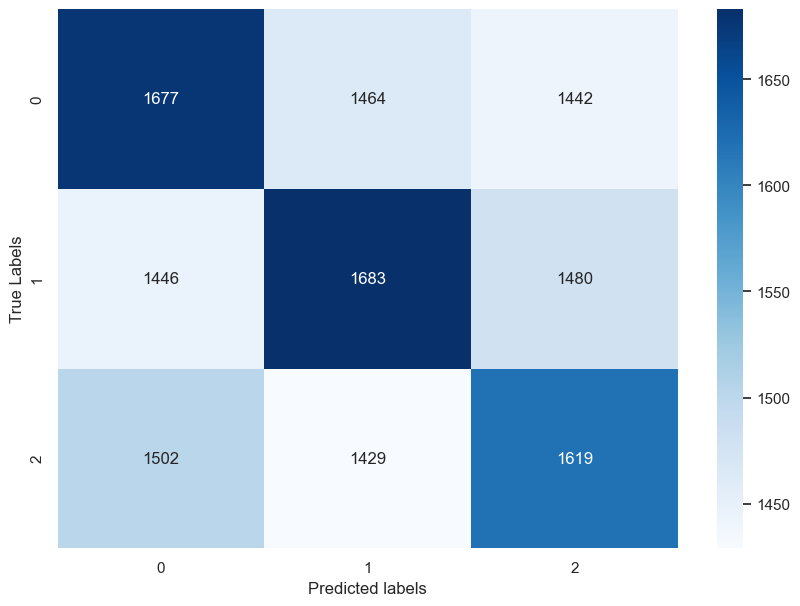

In [92]:
plt.figure(figsize=(10,7))
sns.heatmap(confusion_matrix(y_test, y_test_pred_dt), annot=True, fmt='d',cmap='Blues',
           xticklabels=np.unique(y_test), yticklabels=np.unique(y_test))
plt.xlabel("Predicted labels")
plt.ylabel("True Labels")
plt.show()

## RandomForest Model

In [93]:
rf_model = RandomForestClassifier()
rf_model.fit(x_train, y_train)

RandomForestClassifier()

In [94]:
# predict
rf_train_pred = rf_model.predict(x_train)
rf_test_pred = rf_model.predict(x_test)

In [95]:
# evaluating
acc_rf_train = accuracy_score(y_train, rf_train_pred)
print("RF Train Acc :", acc_rf_train)
acc_rf_test = accuracy_score(y_test, rf_test_pred)
print("RF Test Acc :", acc_rf_test)
print()
report = classification_report(y_test, rf_test_pred)
print("classification report :")
print(report)

RF Train Acc : 0.994784591500097
RF Test Acc : 0.40700043661766844

classification report :
              precision    recall  f1-score   support

           0       0.41      0.41      0.41      4583
           1       0.41      0.42      0.41      4609
           2       0.40      0.40      0.40      4550

    accuracy                           0.41     13742
   macro avg       0.41      0.41      0.41     13742
weighted avg       0.41      0.41      0.41     13742



In [96]:
rf_model.feature_importances_

array([0.37711971, 0.3096982 , 0.03066984, 0.01275119, 0.01176503,
       0.01232647, 0.01245478, 0.01272447, 0.012823  , 0.01340852,
       0.01470247, 0.01453596, 0.01588055, 0.0130005 , 0.01587299,
       0.02542367, 0.02621469, 0.0167853 , 0.01692746, 0.01655675,
       0.01835847])

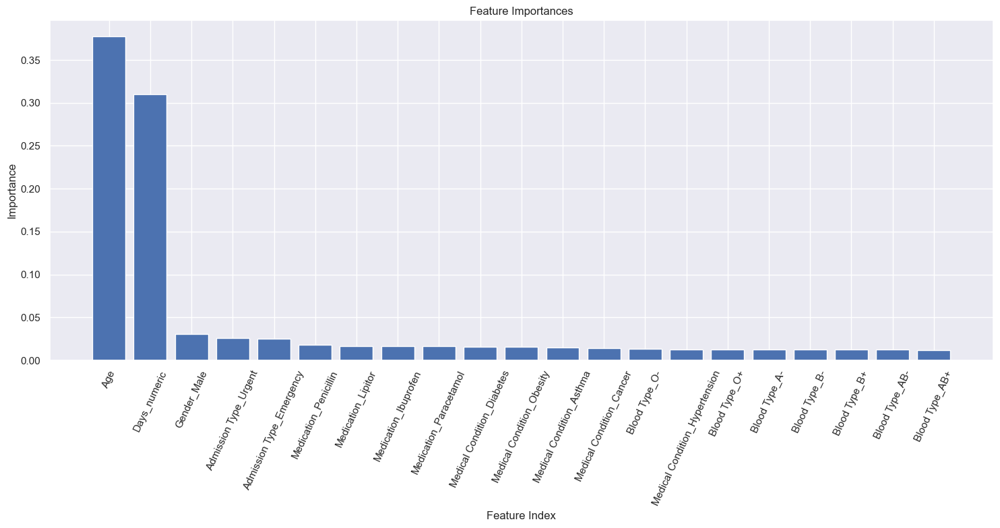

In [97]:
feature_names = x_train.columns
# Feature importances
importances = rf_model.feature_importances_
indices = np.argsort(importances)[::-1]  # Sort in descending order

# Plot
plt.figure(figsize=(15, 8))
plt.title("Feature Importances")
plt.bar(range(x_train.shape[1]), importances[indices], align="center")
plt.xticks(range(x_train.shape[1]), feature_names[indices], rotation=65)
plt.xlabel("Feature Index")
plt.ylabel("Importance")
plt.tight_layout()
plt.show()


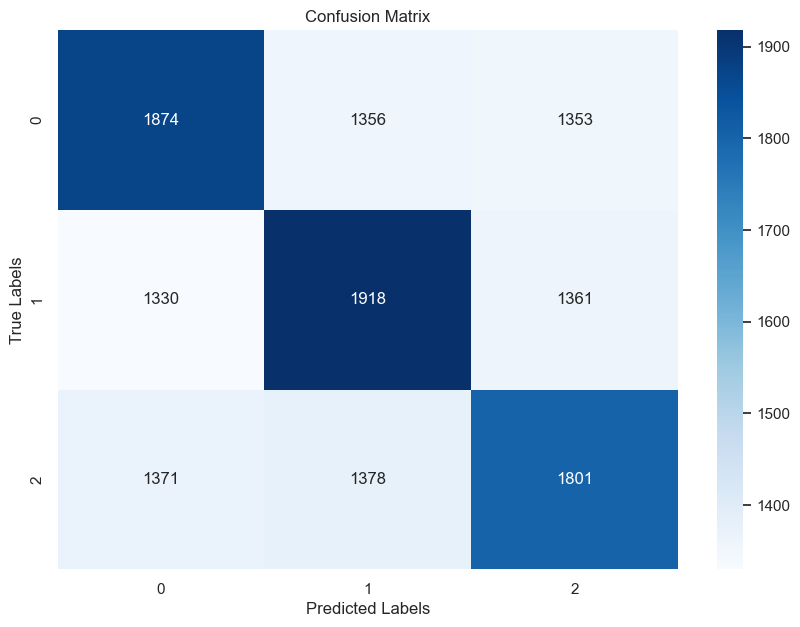

In [98]:
plt.figure(figsize=(10,7))
sns.heatmap(confusion_matrix(y_test, rf_test_pred), annot=True, fmt='d',cmap='Blues',
           xticklabels=np.unique(y_test), yticklabels=np.unique(y_test))
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

## GradientBoosting Classifier Model

In [99]:
gradboost = GradientBoostingClassifier()
gradboost.fit(x_train, y_train)

# predict 
y_gdboost_pred_train = gradboost.predict(x_train)
y_gdboost_pred_test = gradboost.predict(x_test)

# evaluate
print("Trainning Acc :", accuracy_score(y_train, y_gdboost_pred_train))
print("Test Acc :", accuracy_score(y_test, y_gdboost_pred_test))
print("Classification_report :")
print(classification_report(y_test, y_gdboost_pred_test))

Trainning Acc : 0.3822773141859111
Test Acc : 0.3385970018920099
Classification_report :
              precision    recall  f1-score   support

           0       0.34      0.31      0.32      4583
           1       0.34      0.40      0.37      4609
           2       0.34      0.30      0.32      4550

    accuracy                           0.34     13742
   macro avg       0.34      0.34      0.34     13742
weighted avg       0.34      0.34      0.34     13742



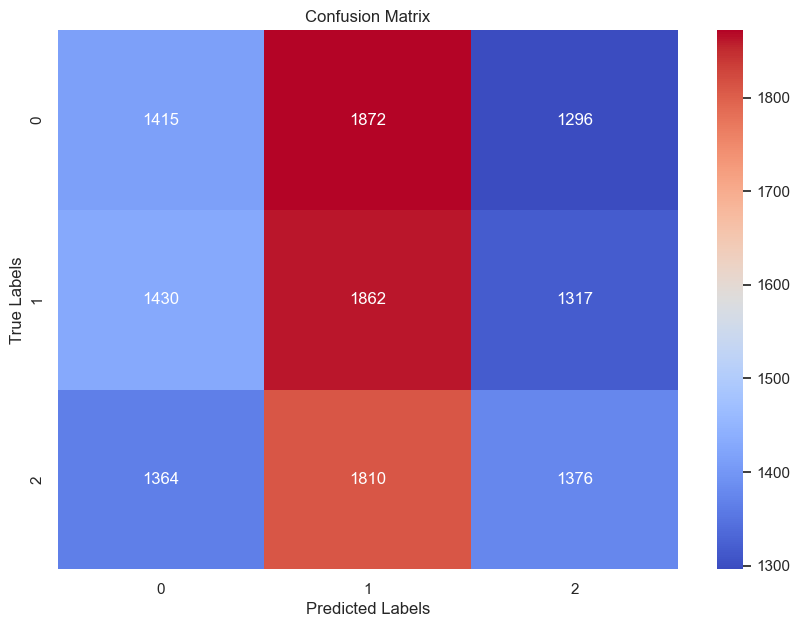

In [100]:
plt.figure(figsize=(10,7))
sns.heatmap(confusion_matrix(y_test, y_gdboost_pred_test), annot=True, fmt='d',cmap='coolwarm',
           xticklabels=np.unique(y_test), yticklabels=np.unique(y_test))
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

# Deep Learning Model:

In [101]:
import tensorflow as tf
from tensorflow import keras
from keras.layers import Dense
from keras.models import Sequential
from keras.layers import Dropout
from keras.callbacks import EarlyStopping

In [102]:
# feature scaling 
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
sc_x = pd.DataFrame(sc.fit_transform(x), columns = x.columns)
sc_x.head()

,Age,Days_numeric,Gender_Male,Blood Type_A-,Blood Type_AB+,Blood Type_AB-,Blood Type_B+,Blood Type_B-,Blood Type_O+,Blood Type_O-,...,Medical Condition_Cancer,Medical Condition_Diabetes,Medical Condition_Hypertension,Medical Condition_Obesity,Admission Type_Emergency,Admission Type_Urgent,Medication_Ibuprofen,Medication_Lipitor,Medication_Paracetamol,Medication_Penicillin
0,-1.098427,-1.558559,0.999527,-0.378821,-0.378318,-0.378067,-0.378412,2.645476,-0.377469,-0.375863,...,2.239148,-0.448824,-0.446921,-0.446774,-0.700748,1.410229,-0.500847,-0.501273,2.003212,-0.498942
1,0.533770,-1.096739,0.999527,-0.378821,-0.378318,-0.378067,-0.378412,-0.378004,-0.377469,-0.375863,...,-0.446598,-0.448824,-0.446921,2.238267,1.427046,-0.709105,1.996618,-0.501273,-0.499198,-0.498942
2,1.247856,-0.057646,-1.000473,2.639772,-0.378318,-0.378067,-0.378412,-0.378004,-0.377469,-0.375863,...,-0.446598,-0.448824,-0.446921,2.238267,1.427046,-0.709105,-0.500847,-0.501273,-0.499198,-0.498942
3,-1.200439,1.674178,-1.000473,-0.378821,-0.378318,-0.378067,-0.378412,-0.378004,2.649223,-0.375863,...,-0.446598,2.228047,-0.446921,-0.446774,-0.700748,-0.709105,1.996618,-0.501273,-0.499198,-0.498942
4,-0.435347,0.519629,-1.000473,-0.378821,2.643279,-0.378067,-0.378412,-0.378004,-0.377469,-0.375863,...,2.239148,-0.448824,-0.446921,-0.446774,-0.700748,1.410229,-0.500847,-0.501273,-0.499198,2.004240


In [103]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(sc_x,y,test_size=0.25,stratify=y,random_state=42)

In [104]:
model = Sequential()
# first hidden layer
model.add(Dense(128, activation='relu', input_shape=(x_train.shape[1],)))
model.add(Dropout(0.25))
# second hidden layer
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.25))
# third hidden layer
model.add(Dense(32, activation='relu'))
model.add(Dropout(0.2))
# output layer
model.add(Dense(3, activation='softmax'))

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model.summary()


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense (Dense)                        │ (None, 128)                 │           2,816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 3)                   │              99 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,251 (51.76 KB)

 Trainable params: 13,251 (51.76 KB)

 Non-trainable params: 0 (0.00 B)

In [105]:
# defining the early_stopping
early_stopping = EarlyStopping(monitor='val_accuracy', patience=5, restore_best_weights=True)

In [106]:
history = model.fit(x_train,y_train, epochs=50,batch_size=32, validation_data=(x_test,y_test), callbacks=[early_stopping],verbose=1)

Epoch 1/50
1289/1289 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.3326 - loss: 1.1136 - val_accuracy: 0.3334 - val_loss: 1.0988
Epoch 2/50
1289/1289 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - accuracy: 0.3406 - loss: 1.0990 - val_accuracy: 0.3363 - val_loss: 1.0985
Epoch 3/50
1289/1289 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.3385 - loss: 1.0988 - val_accuracy: 0.3320 - val_loss: 1.0994
Epoch 4/50
1289/1289 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - accuracy: 0.3380 - loss: 1.0989 - val_accuracy: 0.3336 - val_loss: 1.0987
Epoch 5/50
1289/1289 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - accuracy: 0.3379 - loss: 1.0986 - val_accuracy: 0.3385 - val_loss: 1.0988
Epoch 6/50
1289/1289 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.3407 - loss: 1.0987 - val_accuracy: 0.3367 - val_loss: 1.0986
Epoch 7/50
1289/1289 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.3355 - loss: 1.0988 - val_accuracy: 0.3388 - val_loss: 1.0988
Epoch 8/50
1289/1289 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - accuracy: 0.3394 - loss: 1.0985 -

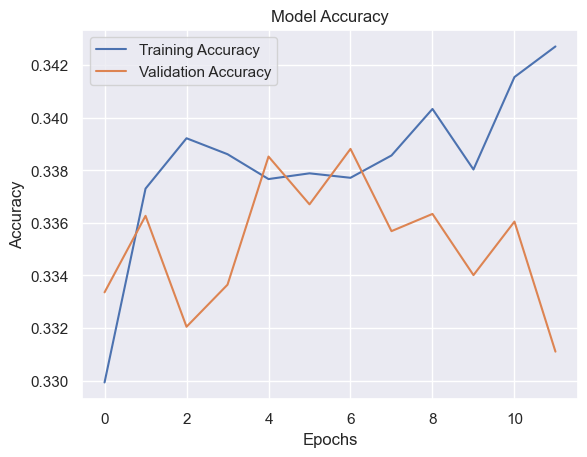

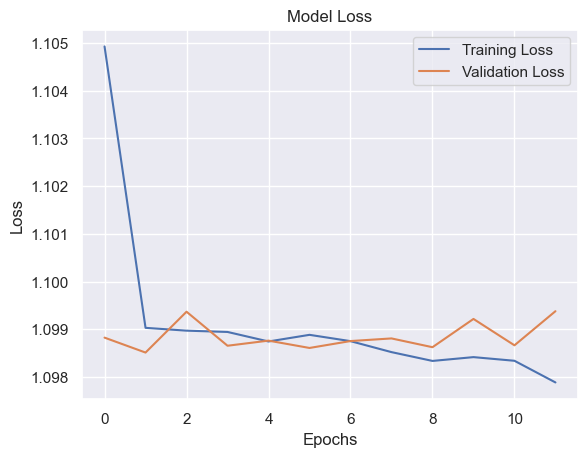

In [107]:
import matplotlib.pyplot as plt

# Plot training & validation accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot training & validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


# Saving the model for deployment

In [ ]:
import pickle
with open("random_forest_model_health.pkl", "wb") as file:
    pickle.dump()